# FSM

The goal of this notebook is to develop the FSM for our project. Our project task is to build a linear regression model to represent sales prices in King County. We were given a list of claims to explore how different home attributes impact the sale price. The goal of this notebook is to develop an initial, baseline model whila also performing initial EDA.

## Plan
- Import libraries and datasets
- Process data
- EDA
- Create FSM

## Import libraries and dataset

In [137]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import sys
module_path = os.path.abspath(os.path.join(os.pardir, os.pardir))
if module_path not in sys.path:
    sys.path.append(module_path)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Now that we have the libraries imported we need to create the dataframe we will use for our model. I will use the create_dataframe() from mc_functions

In [2]:
import src.mc_functions as mc

In [3]:
df = mc.create_dataframe()

## Process data

In [6]:
df.head()

,Major,Minor,SalePrice,SqFt1stFloor,SqFt2ndFloor,SqFtTotLiving,SqFtOpenPorch,SqFtEnclosedPorch,TrafficNoise,AirportNoise,PowerLines,OtherNuisances,TidelandShoreland,PresentUse,has_porch
0,213043,0120,560000,1930,0,1930,180,0,0,0,0,0,0,2,1
1,940652,0630,435000,1057,918,1975,45,0,0,0,0,0,0,2,1
2,140281,0020,450000,1080,0,1080,110,0,0,0,0,0,0,2,1
3,779790,0030,0,730,0,890,0,0,0,0,0,0,0,2,0
4,124550,0098,193000,1140,0,1760,0,0,1,0,0,0,0,2,0


The first thing i see here is that the 'SalePrice' column has some zero values. Those may mess with our model so I will drop the rows that have zeros in 'SalePrice'

In [8]:
df = df[df['SalePrice'] > 0]
df.shape

(29942, 15)

I have the dataframe created, now I can begin to process it. First thing I want to do is check for duplicates and any missing values. I'd also like get an idea of the distributions of the different columns

In [9]:
# Check for duplicate values
sum(df.duplicated() == True)

424

In [10]:
# Check for missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29942 entries, 0 to 43837
Data columns (total 15 columns):
Major                29942 non-null object
Minor                29942 non-null object
SalePrice            29942 non-null int64
SqFt1stFloor         29942 non-null int64
SqFt2ndFloor         29942 non-null int64
SqFtTotLiving        29942 non-null int64
SqFtOpenPorch        29942 non-null int64
SqFtEnclosedPorch    29942 non-null int64
TrafficNoise         29942 non-null int64
AirportNoise         29942 non-null int64
PowerLines           29942 non-null int64
OtherNuisances       29942 non-null int64
TidelandShoreland    29942 non-null int64
PresentUse           29942 non-null int64
has_porch            29942 non-null int64
dtypes: int64(13), object(2)
memory usage: 3.7+ MB


There are almost five hundred duplicate rows and no missing data. We will keep the duplicate rows for now.

Next, I'd like to explore the dataset a little more. For starters, I want to get an idea of the correlation between different variables so I can begin to build the FSM. I'll start with that.

In [11]:
df.corr()

,SalePrice,SqFt1stFloor,SqFt2ndFloor,SqFtTotLiving,SqFtOpenPorch,SqFtEnclosedPorch,TrafficNoise,AirportNoise,PowerLines,OtherNuisances,TidelandShoreland,PresentUse,has_porch
SalePrice,1.000000,0.178004,0.161217,0.246102,0.124826,0.023340,-0.010970,NaN,-0.010140,-0.007733,0.149529,0.014193,0.084929
SqFt1stFloor,0.178004,1.000000,0.176242,0.683955,0.304927,0.010010,-0.076944,NaN,0.025320,-0.078713,0.054112,-0.113865,0.164888
SqFt2ndFloor,0.161217,0.176242,1.000000,0.677181,0.363861,-0.040089,-0.095544,NaN,0.011039,-0.047854,0.017820,0.119129,0.382771
SqFtTotLiving,0.246102,0.683955,0.677181,1.000000,0.419998,-0.010571,-0.082853,NaN,0.018514,-0.068661,0.074833,0.004704,0.319039
SqFtOpenPorch,0.124826,0.304927,0.363861,0.419998,1.000000,-0.011777,-0.034010,NaN,0.019614,-0.022538,0.041043,0.028144,0.492110
SqFtEnclosedPorch,0.023340,0.010010,-0.040089,-0.010571,-0.011777,1.000000,0.035885,NaN,-0.008141,0.006131,0.026675,-0.004254,0.142635
TrafficNoise,-0.010970,-0.076944,-0.095544,-0.082853,-0.034010,0.035885,1.000000,NaN,-0.010846,0.044811,0.019824,-0.003474,-0.038156
AirportNoise,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PowerLines,-0.010140,0.025320,0.011039,0.018514,0.019614,-0.008141,-0.010846,NaN,1.000000,0.007317,-0.009529,-0.015855,0.004470
OtherNuisances,-0.007733,-0.078713,-0.047854,-0.068661,-0.022538,0.006131,0.044811,NaN,0.007317,1.000000,0.013680,0.019222,-0.035195


The target variable we are trying to create the model for is the home 'SalePrice'. Of the columns we have selected, it seems like the home's total square footage has the biggest impact on that. To visualize that I'll make a quick heatmap showing the correlation between the different variables

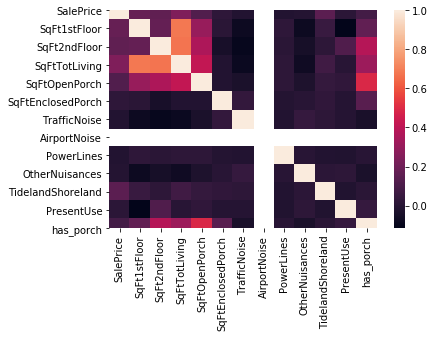

In [12]:
sns.heatmap(df.corr())

Again, the target variable we are looking at is 'SalePrice', so I would like to plot that distribution and see what that looks like.

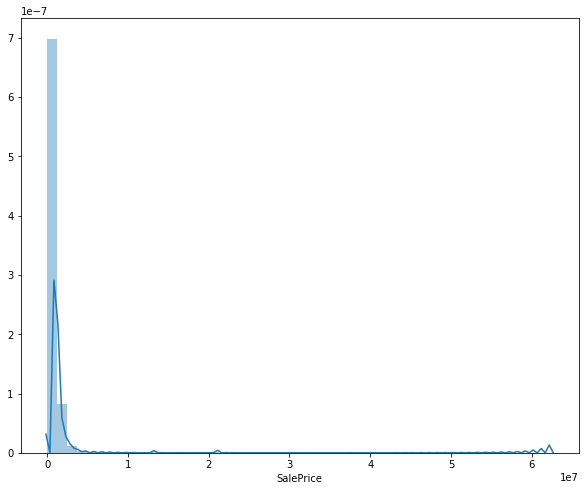

In [13]:
fig, ax = plt.subplots(figsize=(10,8))
sns.distplot(df['SalePrice'], ax=ax)

The majority of houses seem to be in the 100-500 thousand dollar range. It looks like a select few are all the way up at 62 million. One thing is for certain, this dataset is far from normally distributed. I think it would be valuable to see this as a boxplot as well to get another visual for the distribution and better see any outliers.

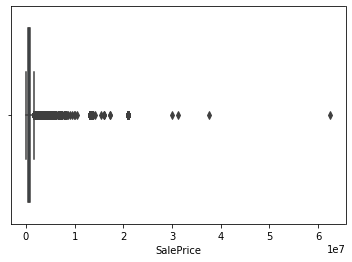

In [14]:
sns.boxplot(df['SalePrice'])

This boxplot shows basically the same thing as above. Only this makes it a little easier to see how grouped together the IQR is and how many large outliers there are. Specifially, the five outliers above twenty million are really skewing the distribution, so I am going to drop those and see how that affects the overall distribution.

In [15]:
df = df[df['SalePrice'] < 20000000]

Now i can plot the distribution again and see how it was affected by dropping those massive outliers.

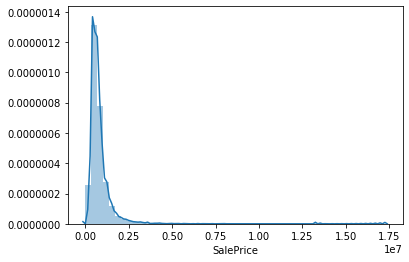

In [16]:
sns.distplot(df['SalePrice'])

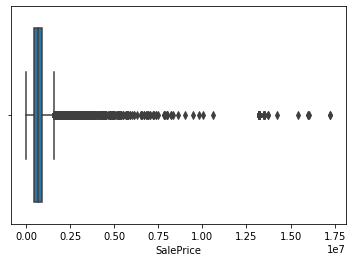

In [17]:
sns.boxplot(df['SalePrice'])

That looks a little bit better, you can actually see the shape of the distribution now. Now, I'd like to check how that affected the correlation between the variables at all.

In [38]:
df.corr()

,SalePrice,SqFt1stFloor,SqFt2ndFloor,SqFtTotLiving,SqFtOpenPorch,SqFtEnclosedPorch,TrafficNoise,AirportNoise,PowerLines,OtherNuisances,TidelandShoreland,PresentUse,has_porch
SalePrice,1.000000,0.243450,0.276754,0.400953,0.202633,0.006412,-0.004776,NaN,-0.010344,-0.002080,0.215121,0.031044,0.150196
SqFt1stFloor,0.243450,1.000000,0.179027,0.684279,0.304004,0.005399,-0.076980,NaN,0.025576,-0.078932,0.046402,-0.114289,0.164058
SqFt2ndFloor,0.276754,0.179027,1.000000,0.678375,0.364667,-0.039804,-0.095755,NaN,0.010971,-0.048011,0.018369,0.119085,0.384033
SqFtTotLiving,0.400953,0.684279,0.678375,1.000000,0.419556,-0.012912,-0.083142,NaN,0.018475,-0.068864,0.071336,0.004633,0.318977
SqFtOpenPorch,0.202633,0.304004,0.364667,0.419556,1.000000,-0.013764,-0.034038,NaN,0.019604,-0.022597,0.038704,0.028137,0.491779
SqFtEnclosedPorch,0.006412,0.005399,-0.039804,-0.012912,-0.013764,1.000000,0.035726,NaN,-0.008126,0.006235,0.021399,-0.004178,0.142509
TrafficNoise,-0.004776,-0.076980,-0.095755,-0.083142,-0.034038,0.035726,1.000000,NaN,-0.010918,0.044709,0.020131,-0.003567,-0.038399
AirportNoise,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PowerLines,-0.010344,0.025576,0.010971,0.018475,0.019604,-0.008126,-0.010918,NaN,1.000000,0.007276,-0.009512,-0.015889,0.004403
OtherNuisances,-0.002080,-0.078932,-0.048011,-0.068864,-0.022597,0.006235,0.044709,NaN,0.007276,1.000000,0.013834,0.019164,-0.035363


So it seems like dropping even those five massive outliers really improved the correlation between the home 'SalePrice' and the other variables. I'm going to do that same thing one more time, only this time I will drop anything over 5 million and see how that impacts the distribution and correlation.

In [47]:
df_under_5mil = df[df['SalePrice'] < 5000000]

In [48]:
df_under_5mil.shape

(29736, 15)

Still only lost about 200 observations total, but it should improve the distribution and correlation considerably.

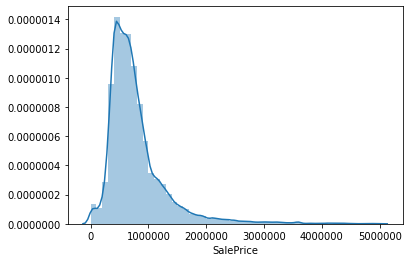

In [49]:
sns.distplot(df_under_5mil['SalePrice'])

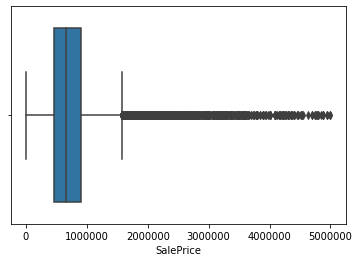

In [50]:
sns.boxplot(df_under_5mil['SalePrice'])

In [51]:
df_under_5mil.corr()

,SalePrice,SqFt1stFloor,SqFt2ndFloor,SqFtTotLiving,SqFtOpenPorch,SqFtEnclosedPorch,TrafficNoise,AirportNoise,PowerLines,OtherNuisances,TidelandShoreland,PresentUse,has_porch
SalePrice,1.000000,0.377997,0.377105,0.585434,0.280787,0.005582,-0.006134,NaN,-0.017532,0.005957,0.143737,0.024375,0.193331
SqFt1stFloor,0.377997,1.000000,0.169517,0.678064,0.296563,0.004521,-0.077096,NaN,0.025786,-0.079112,0.027896,-0.113160,0.163621
SqFt2ndFloor,0.377105,0.169517,1.000000,0.675946,0.361976,-0.042693,-0.095881,NaN,0.012105,-0.047250,0.004248,0.119980,0.383560
SqFtTotLiving,0.585434,0.678064,0.675946,1.000000,0.414140,-0.015493,-0.083426,NaN,0.019850,-0.068677,0.044589,0.006742,0.320446
SqFtOpenPorch,0.280787,0.296563,0.361976,0.414140,1.000000,-0.013351,-0.033692,NaN,0.019620,-0.022083,0.021666,0.029443,0.495071
SqFtEnclosedPorch,0.005582,0.004521,-0.042693,-0.015493,-0.013351,1.000000,0.036713,NaN,-0.008091,0.006483,0.013808,-0.004044,0.143799
TrafficNoise,-0.006134,-0.077096,-0.095881,-0.083426,-0.033692,0.036713,1.000000,NaN,-0.010727,0.044622,0.023413,-0.003423,-0.037532
AirportNoise,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PowerLines,-0.017532,0.025786,0.012105,0.019850,0.019620,-0.008091,-0.010727,NaN,1.000000,0.007378,-0.008631,-0.015746,0.004737
OtherNuisances,0.005957,-0.079112,-0.047250,-0.068677,-0.022083,0.006483,0.044622,NaN,0.007378,1.000000,0.018577,0.019384,-0.035008


Sale prices under 5 million improved the distribution quite a bit, but more importantly the correlation between the other columns more than doubled in most cases. That will be really important for creating the FSM later on. I'm curious what would happen if I only considered the rows with Sale Price under 1 million.

In [52]:
len(df[df['SalePrice'] < 1000000])

23743

That dropped about another six thousand rows which I do not want to lose. So I am going to stick with sale prices under 5 million and see if I can make the distribution more normally distributed another way. To start I am going to log each value and see what effect that has on the distribution and correlation

In [53]:
sp_logged = np.log(df_under_5mil['SalePrice'])

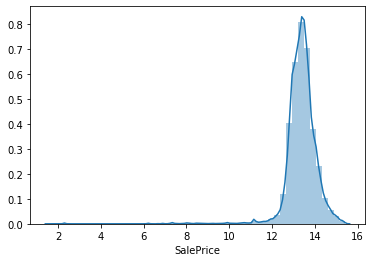

In [55]:
sns.distplot(sp_logged)

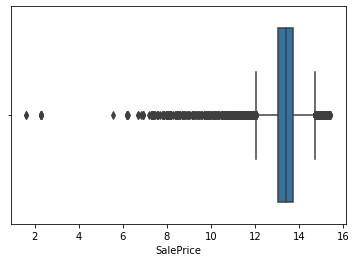

In [56]:
sns.boxplot(sp_logged)

That did not have the effect I wanted, it basically just flipped it. Maybe if I take the log of the original df without removing outliers it will have a better effect.

In [57]:
sp_logged = np.log(df['SalePrice'])

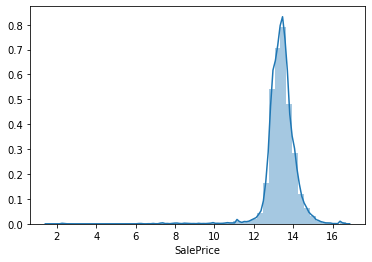

In [58]:
sns.distplot(sp_logged)

That didn't work very well either. For the purposes of the first model, I am going to proceed with the 'SalePrice' column as is. Looking at the correlation table, total square footage has by far the highest correlation with 'SalePrice' at nearly .6. So I will use the total square footage column to create the model. I want to visualize the distribution of that column to see how it's laid out.

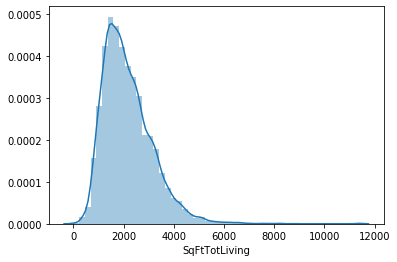

In [61]:
sns.distplot(df_under_5mil['SqFtTotLiving'])

It's actually much more normally distributed that I expected. I am going to plot a boxplot of this data to check for any extreme outliers.

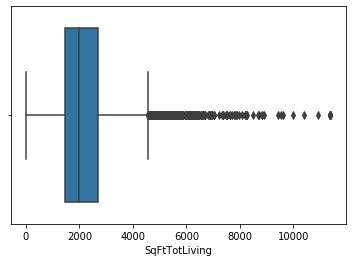

In [62]:
sns.boxplot(df_under_5mil['SqFtTotLiving'])

There are a few outliers past 10000 that may skew the data quite a bit. I am going to get rid of those and see what that does to the distribution and correlation with 'SalePrice'

In [130]:
model_df = df_under_5mil[df_under_5mil['SqFtTotLiving'] < 10000]

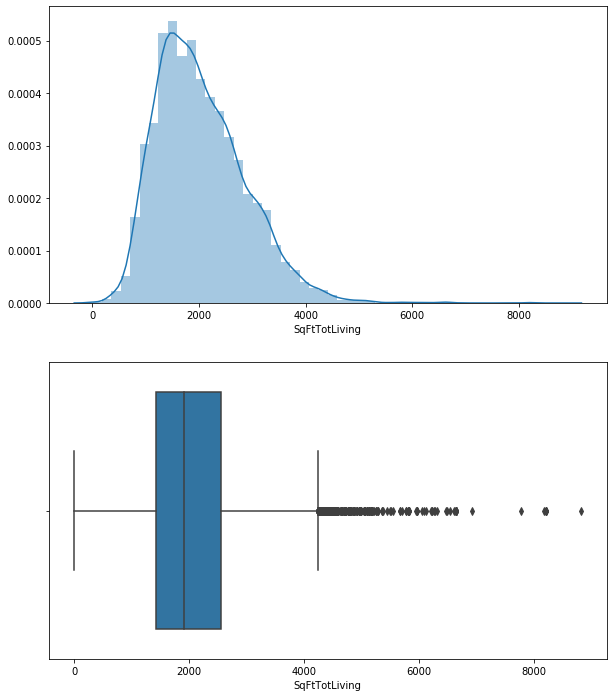

In [146]:
mc.plot_dist(model_df['SqFtTotLiving'])

In [78]:
model_df.corr()

,SalePrice,SqFt1stFloor,SqFt2ndFloor,SqFtTotLiving,SqFtOpenPorch,SqFtEnclosedPorch,TrafficNoise,AirportNoise,PowerLines,OtherNuisances,TidelandShoreland,PresentUse,has_porch
SalePrice,1.000000,0.379051,0.378189,0.594091,0.281603,0.005623,-0.006051,NaN,-0.017520,0.006003,0.143860,0.024482,0.193292
SqFt1stFloor,0.379051,1.000000,0.159430,0.672806,0.287664,0.004925,-0.076743,NaN,0.026206,-0.079230,0.028285,-0.115332,0.162648
SqFt2ndFloor,0.378189,0.159430,1.000000,0.672104,0.354709,-0.042600,-0.095630,NaN,0.012387,-0.047133,0.004446,0.119318,0.383868
SqFtTotLiving,0.594091,0.672806,0.672104,1.000000,0.403350,-0.015166,-0.083458,NaN,0.020583,-0.069186,0.045678,0.004486,0.322661
SqFtOpenPorch,0.281603,0.287664,0.354709,0.403350,1.000000,-0.013082,-0.033064,NaN,0.019964,-0.021815,0.021981,0.028204,0.496134
SqFtEnclosedPorch,0.005623,0.004925,-0.042600,-0.015166,-0.013082,1.000000,0.036690,NaN,-0.008098,0.006471,0.013802,-0.004005,0.143882
TrafficNoise,-0.006051,-0.076743,-0.095630,-0.083458,-0.033064,0.036690,1.000000,NaN,-0.010744,0.044595,0.023401,-0.003329,-0.037401
AirportNoise,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PowerLines,-0.017520,0.026206,0.012387,0.020583,0.019964,-0.008098,-0.010744,NaN,1.000000,0.007371,-0.008635,-0.015722,0.004776
OtherNuisances,0.006003,-0.079230,-0.047133,-0.069186,-0.021815,0.006471,0.044595,NaN,0.007371,1.000000,0.018571,0.019432,-0.034947


In [79]:
model_df.shape

(29724, 15)

Dropping those few increased the correlation by almost .1 and I didn't lose very many rows so I am going to proceed with that. The next step now is to model the data.

## FSM

Since this is a simple linear regression model between two variables, I am going to use the statsmodels formula OLS regression model. This is effective and gives me a very nice summary of the model results

In [157]:
# Set formula
fsm_df = model_df[['SalePrice', 'SqFtTotLiving']]
formula = 'SalePrice ~ SqFtTotLiving'

In [85]:
# Create model
fsm = smf.ols(formula=formula, data=fsm_df).fit()

In [87]:
# get model summary
fsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.353
Model:                            OLS   Adj. R-squared:                  0.353
Method:                 Least Squares   F-statistic:                 1.621e+04
Date:                Mon, 15 Jun 2020   Prob (F-statistic):               0.00
Time:                        19:23:17   Log-Likelihood:            -4.2714e+05
No. Observations:               29724   AIC:                         8.543e+05
Df Residuals:                   29722   BIC:                         8.543e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       9.33e+04   5935.072     15.721      0.000    8.17e+04    1.05e+05
SqFtTotLiving   318.7051      2.503    127.327      0.000     313.799     323.611
==============================================================================
Omnibus:                    16050.797   Durbin-Watson:                   1.773
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           218427.414
Skew:                           2.302   Prob(JB):                         0.00
Kurtosis:                      15.457   Cond. No.                     5.76e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.76e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Okay i can tell right now that the model does not meet all of the linear regression assumptions simply by looking at the JB score. That tests for normality and anything above 6 is considered non-normal so I need to adjust my variables a little bit.

The first thing i want to do and what I probably should have done earlier is check the linear relationship between the SalePrice and total square footage. I will do this using a simple scatter plot.

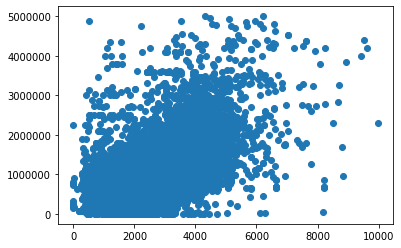

In [88]:
plt.scatter(fsm_df['SqFtTotLiving'], fsm_df['SalePrice'])

There seems to a little bit of a linear relationship between the two although not very well defined. I do not want to drop anymore rows from the dataset, so I am going to try and scale both of these columns and I hope that helps meet the assumptions. I am going to attempt min-max scaling on the saleprice first and see how that affects the distribution.

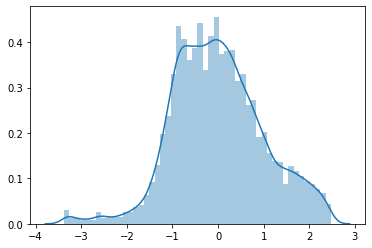

In [158]:
# min-max scaling on saleprice
sale_price = np.array(fsm_df['SalePrice'])
sale_price = sale_price.reshape(-1, 1)
from sklearn.preprocessing import power_transform
scaled_price = power_transform(sale_price)
sns.distplot(scaled_price)

The min max scaling doesn't seem to help with the distribution much for sale price, I am going to try on total square footage and see the effect it has on that

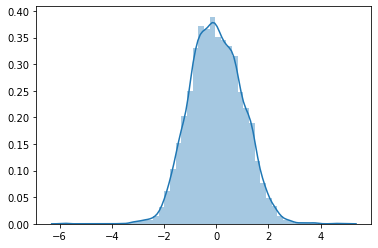

In [151]:
square_footage = np.array(fsm_df['SqFtTotLiving'])
square_footage = square_footage.reshape(-1,1)
scaled_footage = power_transform(square_footage)
sns.distplot(scaled_footage)

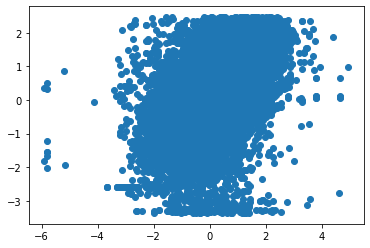

In [152]:
plt.scatter(scaled_footage, scaled_price)

In [154]:
fsm_df.SalePrice = scaled_price
fsm_df.SqFtTotLiving = scaled_footage
formula = 'SalePrice ~ SqFtTotLiving'
fsm = smf.ols(formula=formula, data=fsm_df).fit()


In [155]:
fsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                  0.236
Method:                 Least Squares   F-statistic:                     8499.
Date:                Tue, 16 Jun 2020   Prob (F-statistic):               0.00
Time:                        09:21:06   Log-Likelihood:                -35319.
No. Observations:               27501   AIC:                         7.064e+04
Df Residuals:                   27499   BIC:                         7.066e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.067e-16      0.005  -2.02e-14      1.000      -0.010       0.010
SqFtTotLiving     0.4859      0.005     92.192      0.000       0.476       0.496
==============================================================================
Omnibus:                     1015.599   Durbin-Watson:                   1.885
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2241.751
Skew:                          -0.234   Prob(JB):                         0.00
Kurtosis:                       4.318   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

That also looks pretty similar to the distribution from earlier. I tried to scale the variables using log and scale it using minmax among other scaling and normalizing techniques. I guess the last thing to try is dropping a few more outliers and seeing if that helps.

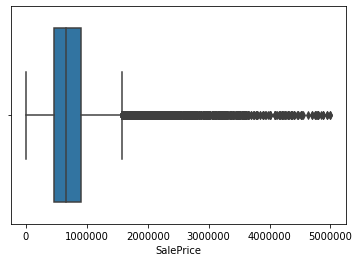

In [110]:
sns.boxplot(sale_price)

In [113]:
len(model_df[model_df['SalePrice']>2000000])

990

There are only about one thousand observations with a sale price above 2 million. So I am going to drop the observations with a sale price greater than two million and hope that improves the model.

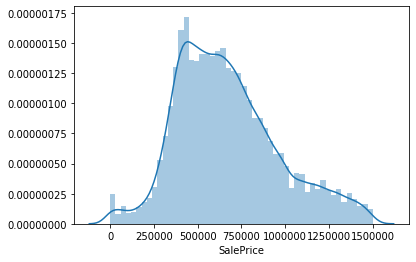

In [139]:
model_df = model_df[model_df['SalePrice']<1500000]
sns.distplot(model_df['SalePrice'])

That looks much better. Now I can check the distribution for square footage.

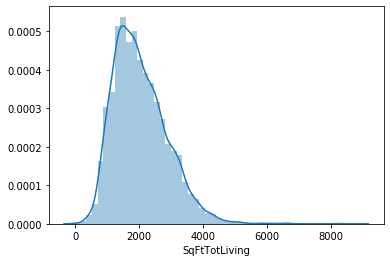

In [140]:
sns.distplot(model_df['SqFtTotLiving'])

That looks much better too. Now I am going to check the linear relationship between the two and see if it improved at all

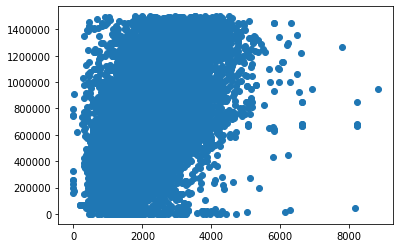

In [141]:
plt.scatter(model_df['SqFtTotLiving'], model_df['SalePrice'])

Not what I was hoping for but still looks better than before. Now I am going to model these two again

In [142]:
fsm_df = model_df[['SalePrice', 'SqFtTotLiving']]

formula = 'SalePrice ~ SqFtTotLiving'
fsm = smf.ols(formula=formula, data=fsm_df).fit()

In [143]:
fsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.253
Method:                 Least Squares   F-statistic:                     9293.
Date:                Mon, 15 Jun 2020   Prob (F-statistic):               0.00
Time:                        20:38:35   Log-Likelihood:            -3.8109e+05
No. Observations:               27501   AIC:                         7.622e+05
Df Residuals:                   27499   BIC:                         7.622e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      3.114e+05   4007.226     77.716      0.000    3.04e+05    3.19e+05
SqFtTotLiving   175.3735      1.819     96.399      0.000     171.808     178.939
==============================================================================
Omnibus:                      628.950   Durbin-Watson:                   1.893
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              839.859
Skew:                           0.281   Prob(JB):                    4.24e-183
Kurtosis:                       3.646   Cond. No.                     5.80e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.8e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Not perfect but much better than before. I am going to plot a Q-Q Plot to see the normality of the errors

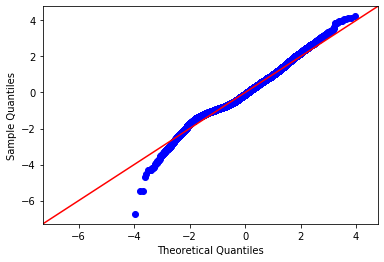

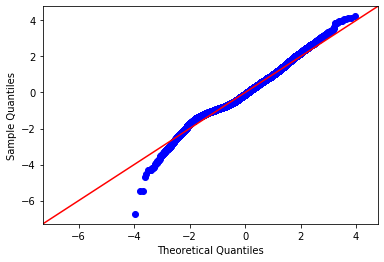

In [144]:
sm.graphics.qqplot(fsm.resid, dist=stats.norm, line='45', fit=True)